In [1]:
from my_helper import *
from estimater import *

Warp 1.0.2 initialized:
   CUDA Toolkit 11.5, Driver 12.2
   Devices:
     "cpu"      : "x86_64"
     "cuda:0"   : "NVIDIA GeForce RTX 2080 Ti" (11 GiB, sm_75, mempool enabled)
   Kernel cache:
     /home/jikaiwang/.cache/warp/1.0.2


# Write Customized DataReader

In [2]:
class MyDataReader:
    def __init__(self, sequence_folder) -> None:
        self._data_folder = Path(sequence_folder).resolve()
        self._calib_folder = self._data_folder.parents[1] / "calibration"
        self._models_folder = self._data_folder.parents[1] / "models"
        self._save_folder = self._data_folder / "processed" / "foundationpose"
        self._zfar = 10.0

        # load metadata
        self._load_metadata()

    def depth2xyz(self, depth, K, T):
        H, W = depth.shape[:2]
        vs, us = np.meshgrid(
            np.arange(0, H), np.arange(0, W), sparse=False, indexing="ij"
        )
        vs = vs.reshape(-1)
        us = us.reshape(-1)
        zs = depth[vs, us]
        xs = (us - K[0, 2]) * zs / K[0, 0]
        ys = (vs - K[1, 2]) * zs / K[1, 1]
        pts = np.stack((xs.reshape(-1), ys.reshape(-1), zs.reshape(-1)), 1)  # (N,3)
        pts = pts @ T[:3, :3].T + T[:3, 3]
        return pts

    def get_init_translation(self, frame_id, serials):
        masks = [
            self.get_mask(serial, frame_id, kernel_size=3) for serial in self._serials
        ]
        depths = [self.get_depth(serial, frame_id) for serial in self._serials]

        pts = [
            self.depth2xyz(depth, K, extr)
            for depth, K, extr in zip(depths, self._Ks, self._extr2world)
        ]
        pts = [pt[mask.flatten().astype(bool)] for pt, mask in zip(pts, masks)]
        pts = np.concatenate(pts, axis=0)
        valid_mask = (
            (pts[:, 0] > -0.6)
            & (pts[:, 0] < 0.6)
            & (pts[:, 1] > -0.4)
            & (pts[:, 1] < 0.4)
            & (pts[:, 2] > 0.0)
            & (pts[:, 2] < 0.8)
        )
        pts = pts[valid_mask]
        pcd = o3d.geometry.PointCloud()
        pcd.points = o3d.utility.Vector3dVector(pts)

        # remove outliers
        cl, ind = pcd.remove_statistical_outlier(nb_neighbors=300, std_ratio=2.0)
        pcd = pcd.select_by_index(ind)

        if np.asarray(pcd.points).shape[0] < 100:
            return [None] * len(serials)

        center = pcd.get_center()
        # transform to each camera coordinate system
        centers = []
        for serial in serials:
            extr = self._extr2world_inv[self._serials.index(serial)]
            center_cam = center @ extr[:3, :3].T + extr[:3, 3]
            centers.append(center_cam)
        centers = np.stack(centers, axis=0)

        return centers

    def _load_metadata(self):
        data = read_data_from_json(self._data_folder / "meta.json")
        # sequnece
        self._num_frames = data["num_frames"]
        self._object_id = data["object_ids"]
        # realsense
        self._serials = data["serials"]
        self._width = data["width"]
        self._height = data["height"]
        self._num_cameras = len(self._serials)

        # load intrinsics
        self._Ks = self._load_intrinsics(self._serials)

        # load extrinsics
        self._load_extrinsics(
            self._calib_folder / "extrinsics" / data["extrinsics"] / "extrinsics.json"
        )

    def _load_intrinsics(self, serials):
        def read_K_from_json(serial):
            json_path = (
                self._calib_folder
                / "intrinsics"
                / f"{serial}_{self._width}x{self._height}.json"
            )
            data = read_data_from_json(json_path)
            K = np.array(
                [
                    [data["color"]["fx"], 0.0, data["color"]["ppx"]],
                    [0.0, data["color"]["fy"], data["color"]["ppy"]],
                    [0.0, 0.0, 1.0],
                ],
                dtype=np.float32,
            )
            return K

        return np.stack([read_K_from_json(serial) for serial in serials], axis=0)

    def _load_extrinsics(self, extr_file):
        """
        Load and process extrinsics from a JSON file.
        """
        data = read_data_from_json(extr_file)

        # Load the extrinsics for tag_1 and compute its inverse
        tag_1 = np.array(
            [
                data["extrinsics"]["tag_1"][0:4],
                data["extrinsics"]["tag_1"][4:8],
                data["extrinsics"]["tag_1"][8:12],
                [0, 0, 0, 1],
            ],
            dtype=np.float32,
        )
        tag_1_inv = np.linalg.inv(tag_1)

        # Load extrinsics for each serial in self._serials
        extr2master_list = [
            np.array(
                [
                    data["extrinsics"][s][0:4],
                    data["extrinsics"][s][4:8],
                    data["extrinsics"][s][8:12],
                    [0, 0, 0, 1],
                ],
                dtype=np.float32,
            )
            for s in self._serials
        ]

        # Convert lists to numpy arrays
        self._extr2master = np.stack(extr2master_list, axis=0)
        self._extr2master_inv = np.linalg.inv(self._extr2master)
        self._extr2world = tag_1_inv @ self._extr2master
        self._extr2world_inv = np.linalg.inv(self._extr2world)

    def get_color(self, serial, frame_id):
        img_file = self._data_folder / serial / f"color_{frame_id:06d}.jpg"
        img = read_rgb_image(img_file)
        return img

    def get_depth(self, serial, frame_id):
        img_file = self._data_folder / serial / f"depth_{frame_id:06d}.png"
        depth = read_depth_image(img_file)
        depth = depth.astype(np.float32) / 1000.0
        depth[(depth < 0.1) | (depth >= self._zfar)] = 0
        return depth

    def get_mask(self, serial, frame_id, kernel_size=0):
        mask_file = (
            self._data_folder
            / "processed/segmentation/xmem_segmentation"
            / f"{serial}/mask_{frame_id:06d}.png"
        )
        if not mask_file.exists():
            return np.zeros((self._height, self._width), dtype=np.uint8)
        mask = cv2.imread(str(mask_file), cv2.IMREAD_GRAYSCALE)
        mask = mask.astype(bool).astype(np.uint8)
        mask = erode_mask(mask, kernel_size)
        return mask

    @property
    def num_frames(self):
        return self._num_frames

    @property
    def serials(self):
        return self._serials

    @property
    def width(self):
        return self._width

    @property
    def height(self):
        return self._height

    @property
    def object_id(self):
        return self._object_id

    @property
    def object_textured_file(self):
        return str(self._models_folder / self._object_id / "textured_mesh.obj")

    @property
    def object_cleaned_file(self):
        return str(self._models_folder / self._object_id / "cleaned_mesh_10000.obj")

    @property
    def Ks(self):
        return self._Ks

# Demonstrate how to run FoundationPose on one camera frame of a recording

### 1. Initialize the Reader and load necessary variables

In [3]:
sequence_folder = PROJ_ROOT / "data/summer_camp/recordings/ida_20240617_101133"

reader = MyDataReader(sequence_folder)
width = reader.width
height = reader.height
num_frames = reader.num_frames
object_id = reader.object_id
Ks = reader.Ks
serials = reader.serials

### 2. Load the mesh

In [4]:
object_textured_mesh = trimesh.load(reader.object_textured_file, process=False)
object_cleaned_mesh = trimesh.load(reader.object_cleaned_file, process=False)

In [5]:
object_textured_mesh.show()

In [6]:
object_cleaned_mesh.show()

### 3. Initialize the OffscreenRenderer

In [7]:
r = pyrender.OffscreenRenderer(width, height)
scene = pyrender.Scene(bg_color=[0, 0, 0], ambient_light=[1.0, 1.0, 1.0])

### 4. Initialize the FoundationPose

- `est_refine_iter`: Number of refinement iterations for the register mode
- `track_refine_iter`: Number of refinement iterations for the tracking mode
- `set_seed`: Set the random seed for reproducibility

- `PoseRefinePredictor()`:

![Pose Refinement](https://miro.medium.com/v2/resize:fit:1400/format:webp/0*_AdBDEp1njYh9OL2)

- `ScorePredictor()`:

![Pose Selection](https://miro.medium.com/v2/resize:fit:1400/format:webp/0*GWiw5_eB-0UZqkVK)

In [8]:
est_refine_iter = 30
track_refine_iter = 5
debug = 1
debug_dir = f"{PROJ_ROOT}/debug"

set_logging_format()
os.system(
    f"rm -rf {debug_dir}/* && mkdir -p {debug_dir}/track_vis {debug_dir}/ob_in_cam"
)
set_seed(0)

In [9]:
# Pose Hypothesis Generation
estimator = FoundationPose(
    model_pts=object_cleaned_mesh.vertices,
    model_normals=object_cleaned_mesh.vertex_normals,
    mesh=object_textured_mesh,
    scorer=ScorePredictor(),
    refiner=PoseRefinePredictor(),
    glctx=dr.RasterizeCudaContext(),
    debug=debug,
    debug_dir=debug_dir,
    rotation_grid_min_n_views=180,
    rotation_grid_inplane_step=60,
)

[__init__()] self.cfg: 
 lr: 0.0001
c_in: 6
zfar: 'Infinity'
debug: null
n_view: 1
run_id: 3wy8qqex
use_BN: true
exp_name: 2024-01-11-20-02-45
n_epochs: 62
save_dir: /home/bowenw/debug/2024-01-11-20-02-45/
use_mask: false
loss_type: pairwise_valid
optimizer: adam
batch_size: 64
crop_ratio: 1.1
enable_amp: true
use_normal: false
max_num_key: null
warmup_step: -1
input_resize:
- 160
- 160
max_step_val: 1000
vis_interval: 1000
weight_decay: 0
normalize_xyz: true
resume_run_id: null
clip_grad_norm: 'Infinity'
lr_epoch_decay: 500
render_backend: nvdiffrast
train_num_pair: 5
lr_decay_epochs:
- 50
n_epochs_warmup: 1
make_pair_online: false
gradient_max_norm: 'Infinity'
max_step_per_epoch: 10000
n_rendering_workers: 1
save_epoch_interval: 100
n_dataloader_workers: 100
split_objects_across_gpus: true
ckpt_dir: /home/jikaiwang/GitHub/FoundationPose/learning/training/../../weights/2024-01-11-20-02-45/model_best.pth

[__init__()] self.h5_file:None
[__init__()] Using pretrained model from /home/jik

num original candidates = 3852
num of pose after clustering: 264


### 5. Track the object pose in one camera view

- Demo sequence: `ida_20240617_101133`
- Demo camera view: second camera view, `cam_idx = 1`


In [10]:
cam_idx = 1
serial = serials[cam_idx]
K = Ks[cam_idx]

### 6. Update OffscreenRenderer with the new camera view

In [11]:
scene.clear()
camera_node = scene.add(
    pyrender.IntrinsicsCamera(
        fx=K[0, 0],
        fy=K[1, 1],
        cx=K[0, 2],
        cy=K[1, 2],
        znear=0.01,
        zfar=10.0,
    ),
    pose=np.eye(4),
)

object_node = scene.add(
    pyrender.Mesh.from_trimesh(object_textured_mesh),
    pose = np.eye(4),
    parent_node = camera_node,
)

### 7. Run the tracking

- for first frame, use the `register` mode to estimate the initial pose
- we assume the delta pose is small, so we can use the `track` mode for the rest of the frames
- `track` mode is faster than `register` mode
- if the delta pose is large, the `track` mode may fail, and we could switch back to the `register` mode to estimate the pose again

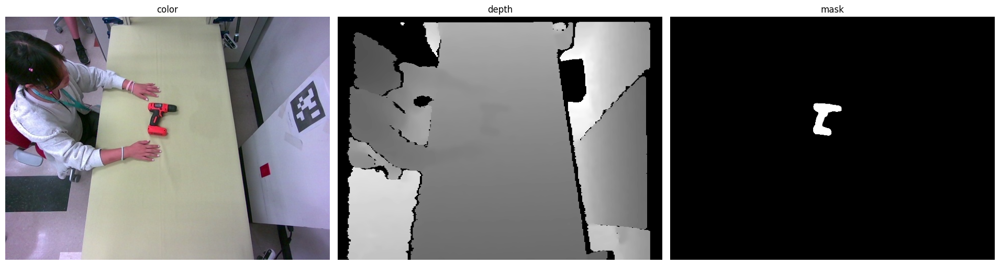

In [12]:
frame_id = 0
color = reader.get_color(serial, frame_id)
depth = reader.get_depth(serial, frame_id)
mask = reader.get_mask(serial, frame_id, kernel_size=3)
display_images([color, depth, mask], ["color", "depth", "mask"])

In [13]:
if frame_id ==0:
    ob_in_cam = estimator.register(
        rgb=color,
        depth=depth,
        ob_mask=mask,
        K=K,
        iteration=est_refine_iter,
    )
else:
    ob_in_cam = estimator.track_one(
        rgb=color,
        depth=depth,
        K=K,
        iteration=track_refine_iter,
    )

print(f"ob_in_cam:\n{ob_in_cam}")


[register()] Welcome
[register()] poses:(264, 4, 4)
[register()] after viewpoint, add_errs min:-1.0
/home/jikaiwang/mambaforge/envs/foundationpose/lib/python3.10/site-packages/torch/__init__.py:614: UserWarning: torch.set_default_tensor_type() is deprecated as of PyTorch 2.1, please use torch.set_default_dtype() and torch.set_default_device() as alternatives. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:451.)
  _C._set_default_tensor_type(t)
[predict()] ob_in_cams:(264, 4, 4)
[predict()] self.cfg.use_normal:False
[predict()] trans_normalizer:[0.019999999552965164, 0.019999999552965164, 0.05000000074505806], rot_normalizer:0.3490658503988659
[predict()] making cropped data
[make_crop_data_batch()] Welcome make_crop_data_batch
[make_crop_data_batch()] make tf_to_crops done
[make_crop_data_batch()] render done
[make_crop_data_batch()] warp done


Module Utils load on device 'cuda:0' took 5.59 ms


[make_crop_data_batch()] pose batch data done
[predict()] forward start
[predict()] forward done
[predict()] making cropped data
[make_crop_data_batch()] Welcome make_crop_data_batch
[make_crop_data_batch()] make tf_to_crops done
[make_crop_data_batch()] render done
[make_crop_data_batch()] warp done
[make_crop_data_batch()] pose batch data done
[predict()] forward start
[predict()] forward done
[predict()] making cropped data
[make_crop_data_batch()] Welcome make_crop_data_batch
[make_crop_data_batch()] make tf_to_crops done
[make_crop_data_batch()] render done
[make_crop_data_batch()] warp done
[make_crop_data_batch()] pose batch data done
[predict()] forward start
[predict()] forward done
[predict()] making cropped data
[make_crop_data_batch()] Welcome make_crop_data_batch
[make_crop_data_batch()] make tf_to_crops done
[make_crop_data_batch()] render done
[make_crop_data_batch()] warp done
[make_crop_data_batch()] pose batch data done
[predict()] forward start
[predict()] forward do

ob_in_cam:
[[-0.99291843  0.11844049  0.00919816 -0.04336327]
 [-0.10568377 -0.9160264   0.3869451  -0.14383627]
 [ 0.05425572  0.38323283  0.9220568   1.0748786 ]
 [ 0.          0.          0.          1.        ]]


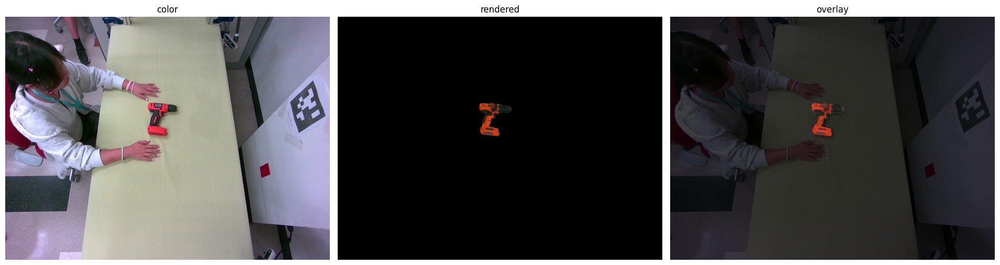

In [14]:
scene.set_pose(object_node, pose=cvcam_in_glcam @ ob_in_cam)
r_color, _ = r.render(scene)
vis = cv2.addWeighted(color, 0.25, r_color, 0.75, 0)
display_images([color, r_color, vis], ["color", "rendered", "overlay"])

- we assume the delta pose is small, so we can use the `track` mode for the rest of the frames
- `track` mode is faster than `register` mode

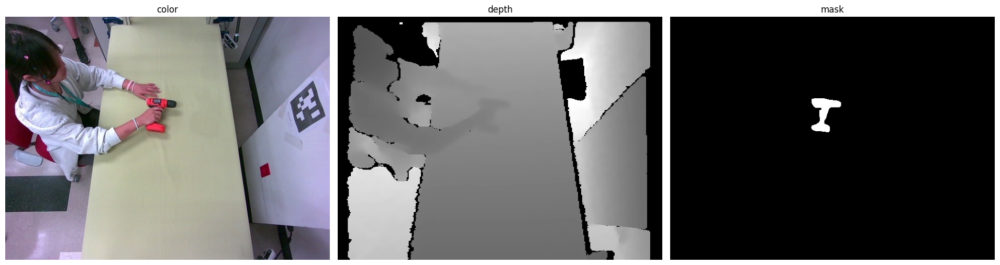

In [15]:
frame_id = 90
color = reader.get_color(serial, frame_id)
depth = reader.get_depth(serial, frame_id)
mask = reader.get_mask(serial, frame_id, kernel_size=3)
display_images([color, depth, mask], ["color", "depth", "mask"])

In [16]:
ob_in_cam = estimator.track_one(
    rgb=color,
    depth=depth,
    K=K,
    iteration=track_refine_iter,
)

print(f"ob_in_cam:\n{ob_in_cam}")

[track_one()] Welcome
[track_one()] depth processing done
[predict()] ob_in_cams:(1, 4, 4)
[predict()] self.cfg.use_normal:False
[predict()] trans_normalizer:[0.019999999552965164, 0.019999999552965164, 0.05000000074505806], rot_normalizer:0.3490658503988659
[predict()] making cropped data
[make_crop_data_batch()] Welcome make_crop_data_batch
[make_crop_data_batch()] make tf_to_crops done
[make_crop_data_batch()] render done
[make_crop_data_batch()] warp done
[make_crop_data_batch()] pose batch data done
[predict()] forward start
[predict()] forward done
[predict()] making cropped data
[make_crop_data_batch()] Welcome make_crop_data_batch
[make_crop_data_batch()] make tf_to_crops done
[make_crop_data_batch()] render done
[make_crop_data_batch()] warp done
[make_crop_data_batch()] pose batch data done
[predict()] forward start
[predict()] forward done
[predict()] making cropped data
[make_crop_data_batch()] Welcome make_crop_data_batch
[make_crop_data_batch()] make tf_to_crops done
[mak

ob_in_cam:
[[-0.9894751   0.1432518   0.02043672 -0.0498053 ]
 [-0.13425396 -0.9615207   0.23969501 -0.1621613 ]
 [ 0.05398707  0.2344285   0.9706331   1.0474956 ]
 [ 0.          0.          0.          1.        ]]


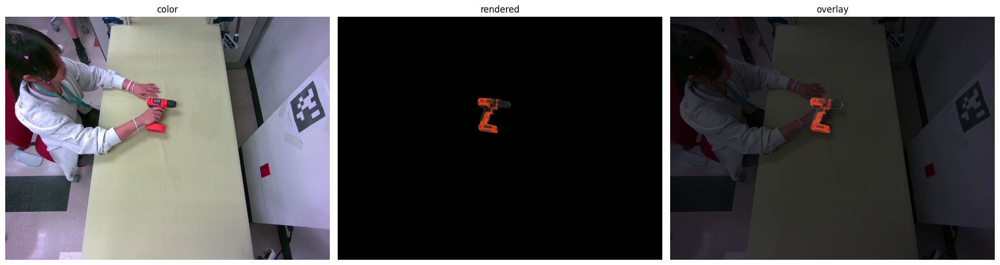

In [17]:
scene.set_pose(object_node, pose=cvcam_in_glcam @ ob_in_cam)
r_color, _ = r.render(scene)
vis = cv2.addWeighted(color, 0.25, r_color, 0.75, 0)
display_images([color, r_color, vis], ["color", "rendered", "overlay"])

- if the delta pose is large, the `track` mode may fail, and we could switch back to the `register` mode to estimate the pose again

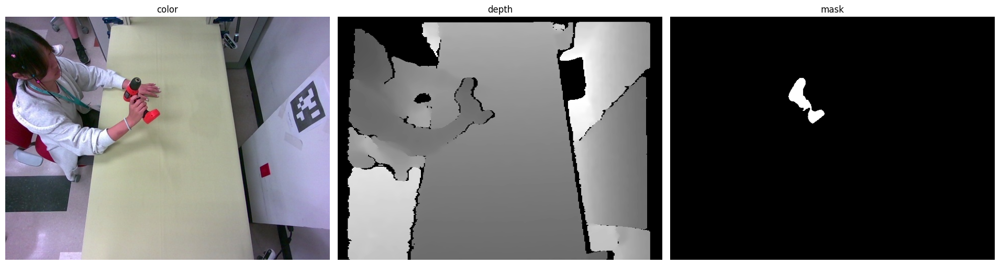

In [18]:
frame_id = 200
color = reader.get_color(serial, frame_id)
depth = reader.get_depth(serial, frame_id)
mask = reader.get_mask(serial, frame_id, kernel_size=3)
display_images([color, depth, mask], ["color", "depth", "mask"])

In [19]:
ob_in_cam = estimator.track_one(
    rgb=color,
    depth=depth,
    K=K,
    iteration=track_refine_iter,
)

[track_one()] Welcome
[track_one()] depth processing done
[predict()] ob_in_cams:(1, 4, 4)
[predict()] self.cfg.use_normal:False
[predict()] trans_normalizer:[0.019999999552965164, 0.019999999552965164, 0.05000000074505806], rot_normalizer:0.3490658503988659
[predict()] making cropped data
[make_crop_data_batch()] Welcome make_crop_data_batch
[make_crop_data_batch()] make tf_to_crops done
[make_crop_data_batch()] render done
[make_crop_data_batch()] warp done
[make_crop_data_batch()] pose batch data done
[predict()] forward start
[predict()] forward done
[predict()] making cropped data
[make_crop_data_batch()] Welcome make_crop_data_batch
[make_crop_data_batch()] make tf_to_crops done
[make_crop_data_batch()] render done
[make_crop_data_batch()] warp done
[make_crop_data_batch()] pose batch data done
[predict()] forward start
[predict()] forward done
[predict()] making cropped data
[make_crop_data_batch()] Welcome make_crop_data_batch
[make_crop_data_batch()] make tf_to_crops done
[mak

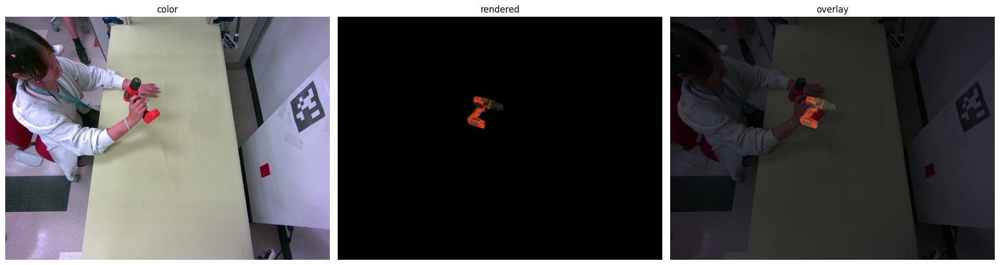

In [20]:
scene.set_pose(object_node, pose=cvcam_in_glcam @ ob_in_cam)
r_color, _ = r.render(scene)
vis = cv2.addWeighted(color, 0.25, r_color, 0.75, 0)
display_images([color, r_color, vis], ["color", "rendered", "overlay"])

In [21]:
ob_in_cam = estimator.register(
    rgb=color,
    depth=depth,
    ob_mask=mask,
    K=K,
    iteration=est_refine_iter,
)

[register()] Welcome
[register()] poses:(264, 4, 4)
[register()] after viewpoint, add_errs min:-1.0
[predict()] ob_in_cams:(264, 4, 4)
[predict()] self.cfg.use_normal:False
[predict()] trans_normalizer:[0.019999999552965164, 0.019999999552965164, 0.05000000074505806], rot_normalizer:0.3490658503988659
[predict()] making cropped data
[make_crop_data_batch()] Welcome make_crop_data_batch
[make_crop_data_batch()] make tf_to_crops done
[make_crop_data_batch()] render done
[make_crop_data_batch()] warp done
[make_crop_data_batch()] pose batch data done
[predict()] forward start
[predict()] forward done
[predict()] making cropped data
[make_crop_data_batch()] Welcome make_crop_data_batch
[make_crop_data_batch()] make tf_to_crops done
[make_crop_data_batch()] render done
[make_crop_data_batch()] warp done
[make_crop_data_batch()] pose batch data done
[predict()] forward start
[predict()] forward done
[predict()] making cropped data
[make_crop_data_batch()] Welcome make_crop_data_batch
[make_c

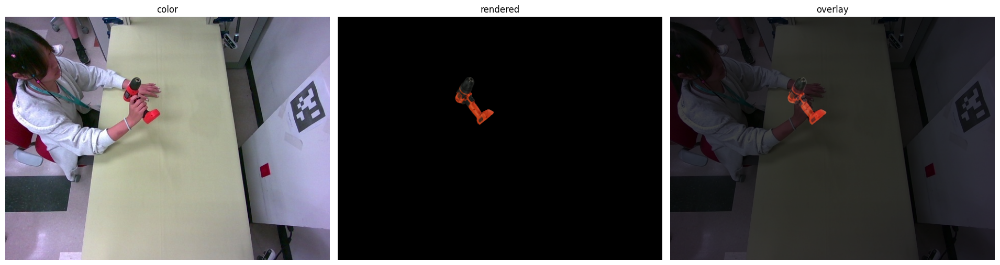

In [22]:
scene.set_pose(object_node, pose=cvcam_in_glcam @ ob_in_cam)
r_color, _ = r.render(scene)
vis = cv2.addWeighted(color, 0.25, r_color, 0.75, 0)
display_images([color, r_color, vis], ["color", "rendered", "overlay"])